Name: Raheel Shaikh            
StudentId: 001245231

In [4]:
!pip install hvplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 27.6 MB/s eta 0:00:00


In [5]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import hvplot.pandas
import holoviews as hv
import plotly.express as px

Pulling the data


In [6]:
dataCustomerVisits = pd.read_csv('https://tinyurl.com/ChrisCoDV/001245231/OutletDailyCustomers.csv',index_col=0)
display(dataCustomerVisits)
pd.plotting.register_matplotlib_converters()
dataCustomerVisits.index = pd.to_datetime(dataCustomerVisits.index)

,NFH,YGE,MZO,HZQ,CNW,LTU,DHJ,YMQ,HTF,LLK,...,XSB,PFQ,OZW,DSA,RFY,PLB,EEC,RAN,AYD,QZF
Date,,,,,,,,,,,,,,,,,,,,,
2021-01-01,88,57,73,73,87,67,78,0,54,77,...,0,57,80,1090,2222,91,1173,1860,0,73
2021-01-02,100,67,64,63,75,76,91,0,76,72,...,0,68,85,910,1887,82,1066,2354,0,68
2021-01-03,87,73,74,62,61,81,106,0,98,79,...,0,66,86,1005,2056,86,872,1884,0,74
2021-01-04,89,55,69,71,48,83,71,0,89,75,...,0,83,84,941,2191,87,614,2008,0,61
2021-01-05,83,61,71,62,78,65,97,0,65,76,...,0,68,82,873,1632,87,722,1197,0,83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,103,0,73,75,76,84,81,66,0,82,...,38,94,92,867,1727,93,808,2066,77,71
2021-12-28,98,0,77,63,72,75,51,121,0,87,...,88,94,77,907,1531,91,717,2255,124,89
2021-12-29,83,0,68,56,71,85,92,125,0,86,...,68,92,87,964,1965,89,684,2039,92,75


Sorting the data

In [7]:
dataCustomerVisits = dataCustomerVisits.reindex(dataCustomerVisits.sum().sort_values(ascending=False).index, axis=1)
print(dataCustomerVisits)

             RAN   RFY   DMN   DSA   EYS   EEC   BMF   BSQ  CYK  CGV  ...  \
Date                                                                  ...   
2021-01-01  1860  2222  2270  1090  1011  1173   807  1076  829  777  ...   
2021-01-02  2354  1887  1913   910  1155  1066  1112   755  753  778  ...   
2021-01-03  1884  2056  1816  1005   979   872   809   760  687  716  ...   
2021-01-04  2008  2191  1576   941  1006   614   665   646  696  610  ...   
2021-01-05  1197  1632  1714   873   805   722   877   632  611  669  ...   
...          ...   ...   ...   ...   ...   ...   ...   ...  ...  ...  ...   
2021-12-27  2066  1727  2005   867   849   808   863   644  699  627  ...   
2021-12-28  2255  1531  1298   907   871   717   821   529  647  672  ...   
2021-12-29  2039  1965  1691   964   988   684   639   705  835  629  ...   
2021-12-30  1973  1985  1972  1080   938  1063  1002   716  870  774  ...   
2021-12-31  1939  2334  1830  1039  1170  1184   870   959  831  778  ...   

In [5]:
dataCustomerVisits.sum().count()

45

In [6]:
dataCustomerVisits.sum()

RAN    737306
RFY    706691
DMN    678009
DSA    368637
EYS    351330
EEC    331906
BMF    307906
BSQ    285050
CYK    272771
CGV    259246
NFH     32908
OZW     32108
PLB     31941
END     31633
FZI     31022
DTO     30857
DHJ     30659
IFI     28836
LLK     28725
OTL     28652
EHT     28235
GNL     27777
LTU     27631
QZF     27028
CNW     26030
MZO     25554
PFQ     25552
FTW     25461
HZQ     24448
NLT     23728
CTH     22997
GFA     22177
MTE     22118
DZZ     20810
YGE     17865
HNV     16647
HTF     15225
IZX     15199
AYD     15060
XSB     10308
ZSJ      9578
YMQ      8983
ZYT      6543
ZMY      5299
AGN      3723
dtype: int64

Data Segmentation -Bar chart for the entire outlet data set.

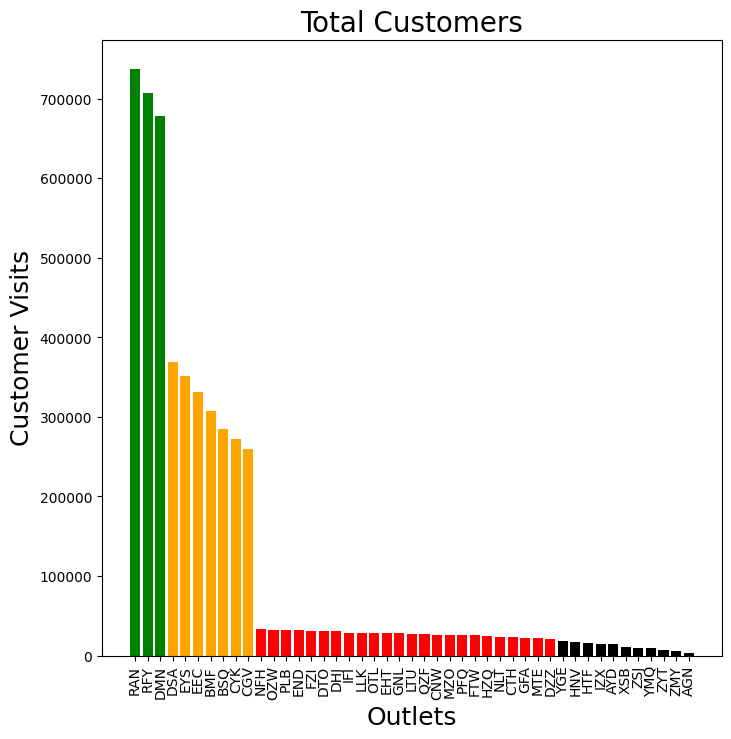

In [8]:
colours = []
for name in dataCustomerVisits.columns:
    total_sales = dataCustomerVisits[name].sum()
    if total_sales > 500000: ################## changed
        colour = 'green'
    elif total_sales > 100000: ################ changed
        colour = 'orange'
    elif total_sales > 20000: ##################### changed
        colour = 'red'
    #  elif total_sales> 0:
        # color = 'green'
    else:
        colour = 'black'
    colours.append(colour)

plt.figure(figsize=(8, 8))
x_pos = np.arange(len(dataCustomerVisits.columns))
plt.bar(x_pos, dataCustomerVisits.sum(), align='center', color=colours)
plt.xticks(x_pos, dataCustomerVisits.columns, rotation=90) ## rotated
plt.xlabel('Outlets', fontsize=18) ############ changed
plt.ylabel('Customer Visits', fontsize=18) ########## changed
plt.title('Total Customers', fontsize=20) ##### changed
plt.show()

Line graph for the entire outlet dataset



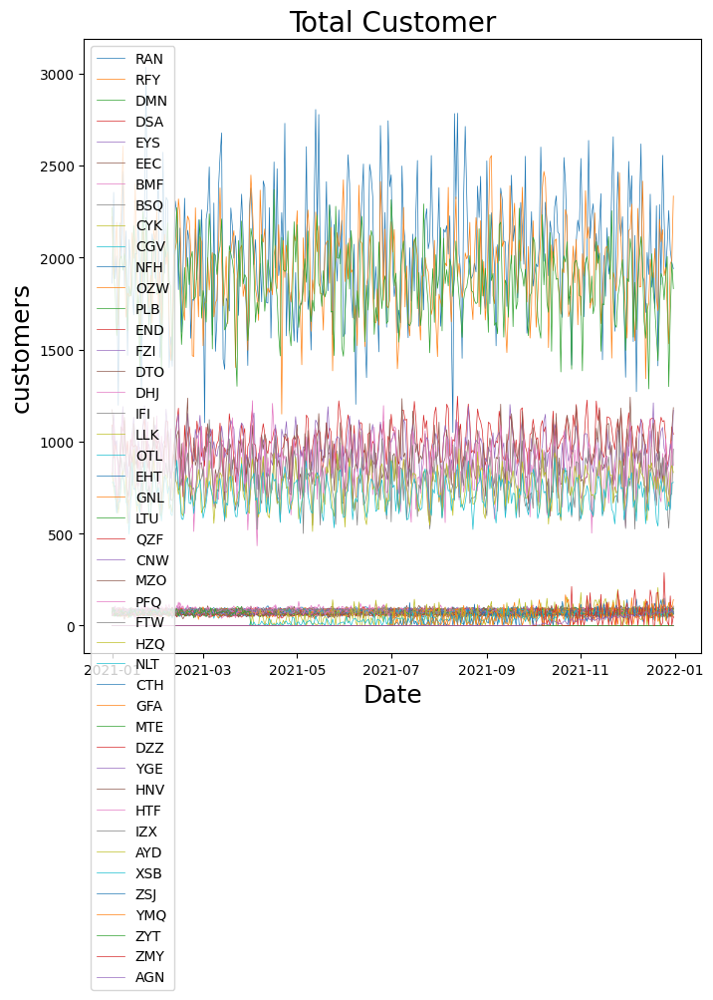

In [9]:
plt.figure(figsize=(8, 8))
plt.plot(dataCustomerVisits, linewidth=0.5)
plt.xlabel('Date', fontsize=18)
plt.ylabel('customers', fontsize=18)
plt.title('Total Customer', fontsize=20)
plt.legend(dataCustomerVisits.columns, loc=2)
plt.show()

Segmenting the data into 3 (High, Medium,low) volume segments.

In [10]:
categories=['High','Medium','Low','Very Low']
categories_selected=[[]for i in range(len(categories))]
for name in dataCustomerVisits.columns:
    total_sales = dataCustomerVisits[name].sum()
    if total_sales > 400000:
         category = 0
    elif total_sales > 100000:
        category = 1
    elif total_sales > 20000:
        category = 2    
    else:
        category = 3
    categories_selected[category].append(name)
    print('Product ' + name + ' is ' + categories[category] + ' volume')

High_Volume=categories_selected[0]
Medium_Volume=categories_selected[1]
Low_Volume=categories_selected[2]
VeryLow_Volume = categories_selected[3]

Product RAN is High volume
Product RFY is High volume
Product DMN is High volume
Product DSA is Medium volume
Product EYS is Medium volume
Product EEC is Medium volume
Product BMF is Medium volume
Product BSQ is Medium volume
Product CYK is Medium volume
Product CGV is Medium volume
Product NFH is Low volume
Product OZW is Low volume
Product PLB is Low volume
Product END is Low volume
Product FZI is Low volume
Product DTO is Low volume
Product DHJ is Low volume
Product IFI is Low volume
Product LLK is Low volume
Product OTL is Low volume
Product EHT is Low volume
Product GNL is Low volume
Product LTU is Low volume
Product QZF is Low volume
Product CNW is Low volume
Product MZO is Low volume
Product PFQ is Low volume
Product FTW is Low volume
Product HZQ is Low volume
Product NLT is Low volume
Product CTH is Low volume
Product GFA is Low volume
Product MTE is Low volume
Product DZZ is Low volume
Product YGE is Very Low volume
Product HNV is Very Low volume
Product HTF is Very Low volume

Line subplots of for all the outlets

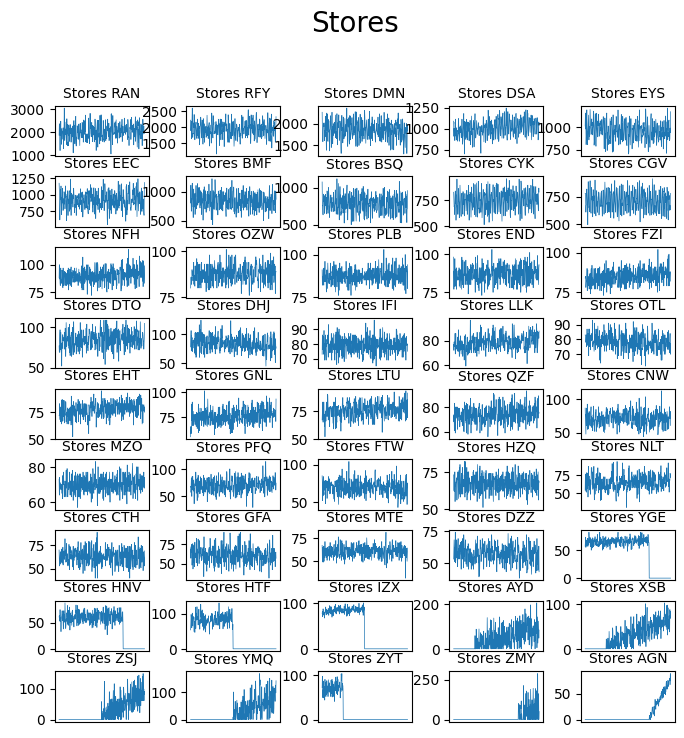

In [10]:
counter = 1
fig = plt.figure(figsize=(8, 8))
fig.suptitle('Stores', fontsize=20,position=(0.5, 1.0))
for name in dataCustomerVisits.columns:
    sub = fig.add_subplot(9,5 ,counter)
    sub.set_title('Stores ' + name, fontsize=10)
    sub.plot(dataCustomerVisits.index, dataCustomerVisits[name], linewidth=0.5)
    sub.axes.get_xaxis().set_ticks([]) # remove x ticks
    counter += 1
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()


Ploting a line graph with a trend line of the weekly average for the store that either close or opened.


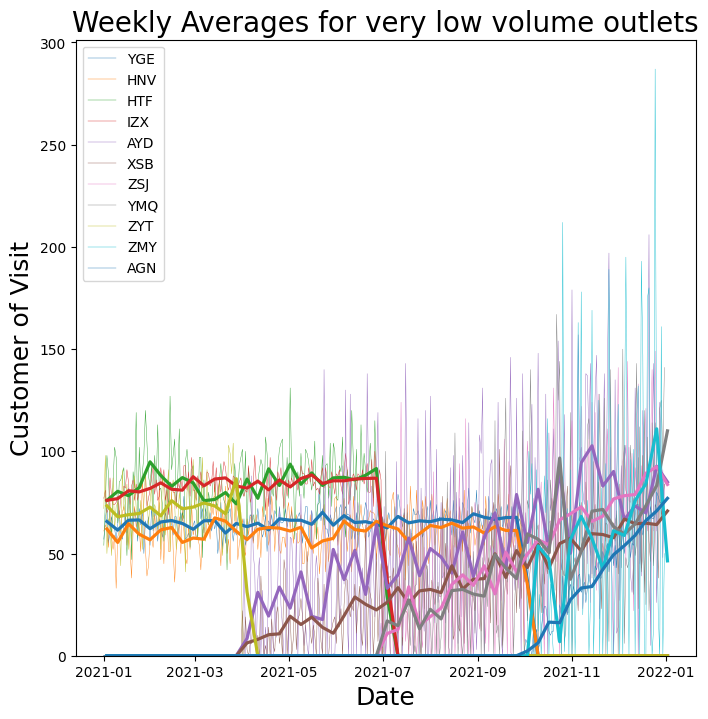

In [11]:
sample_rate = 'W'
averaged_data = dataCustomerVisits.resample(sample_rate).mean()
selected = VeryLow_Volume
plt.figure(figsize=(8, 8))
plt.plot(dataCustomerVisits[selected], linewidth=0.3)
plt.gca().set_prop_cycle(None)
plt.plot(averaged_data[selected], linewidth=2.3)
plt.xlabel('Date', fontsize=18)
plt.ylim(ymin=0)
plt.ylabel('Customer of Visit', fontsize=18)
plt.title('Weekly Averages for very low volume outlets', fontsize=20)
plt.legend(averaged_data[selected], loc=2)
plt.legend(averaged_data[selected], loc=2)
plt.show()


Box plot for medium volume outlets


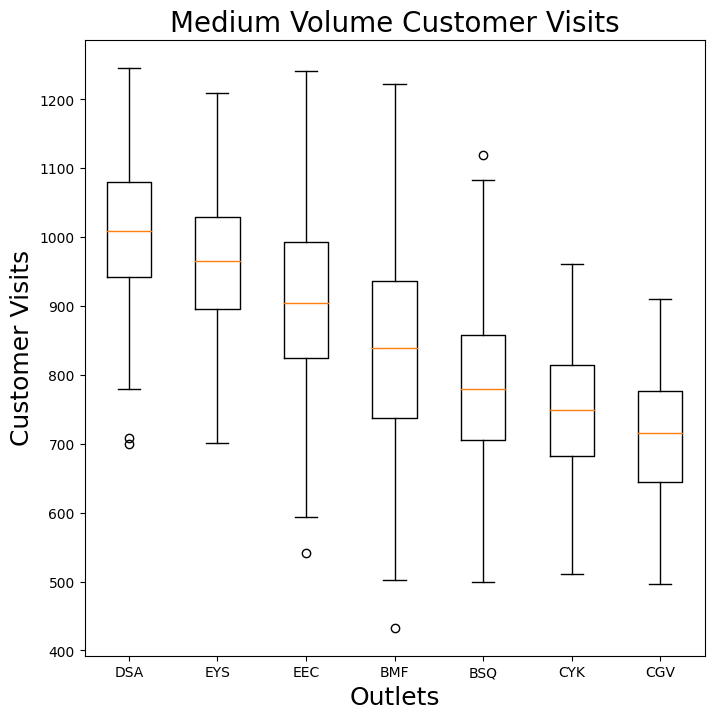

In [12]:
selected = Medium_Volume
plt.figure(figsize=(8, 8))
#data[high_volume].boxplot()
plt.boxplot(dataCustomerVisits[selected], labels=Medium_Volume)
plt.xlabel('Outlets', fontsize=18)
plt.ylabel('Customer Visits', fontsize=18)
plt.title('Medium Volume Customer Visits', fontsize=20)
plt.show()

Interactive Bar charts

In [13]:
selected = Medium_Volume

fig = px.box(dataCustomerVisits,y=selected)
fig.update_yaxes(title='Customer Visits')
fig.update_xaxes(title='Outlets')
fig.update_layout(title='Distribution for Medium Volume Outlets')
fig.show()

Line graph for high volume outlets with weekly average line.

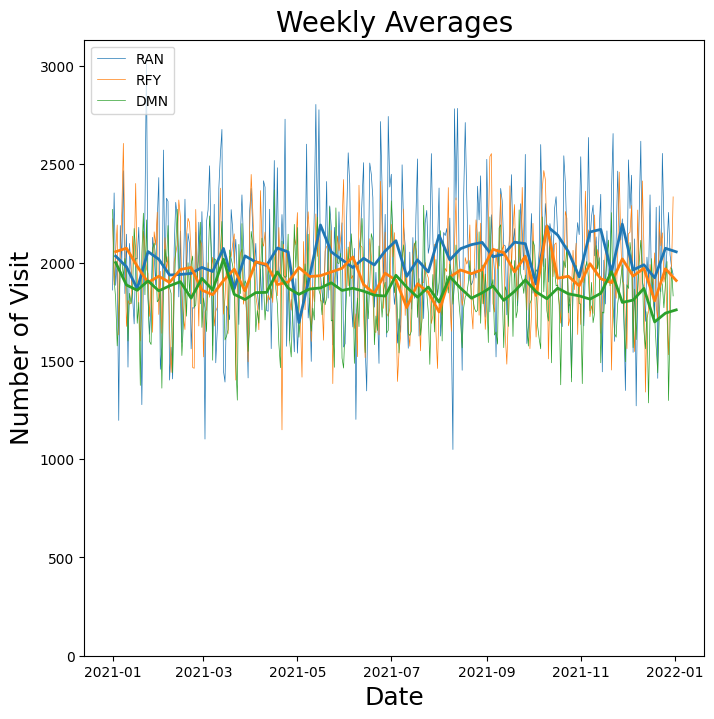

In [14]:
sample_rate = 'W'
averaged_data = dataCustomerVisits.resample(sample_rate).mean()
selected = High_Volume

plt.figure(figsize=(8, 8))
plt.plot(dataCustomerVisits[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(averaged_data[selected], linewidth=2)
plt.xlabel('Date', fontsize=18)
plt.ylim(ymin=0)
plt.ylabel('Number of Visit', fontsize=18)
plt.title('Weekly Averages', fontsize=20)
plt.legend(dataCustomerVisits[selected], loc=2)
plt.show()


Medium Volume outlets with trend line

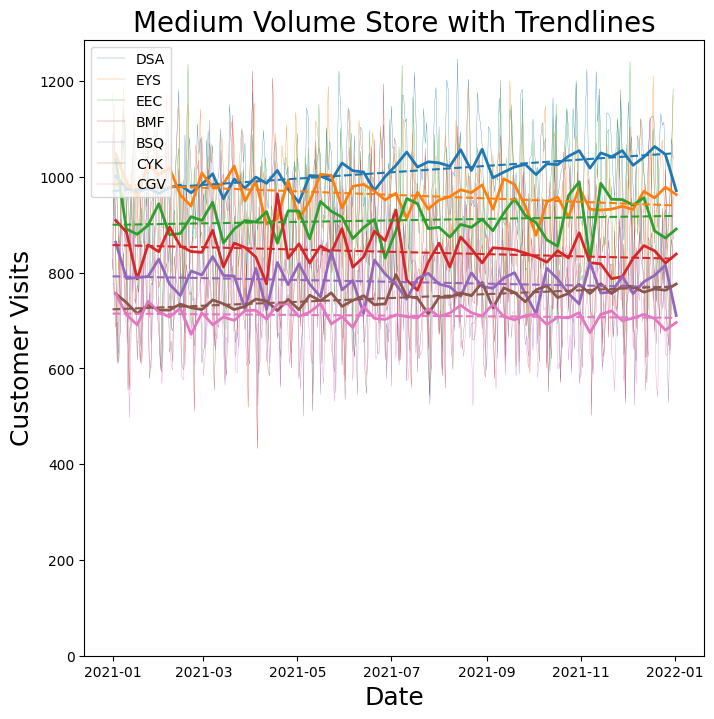

In [15]:
selected = Medium_Volume
averaged_data = dataCustomerVisits.resample(sample_rate).mean()

plt.figure(figsize=(8, 8))
plt.plot(dataCustomerVisits[selected], linewidth=0.2)
plt.gca().set_prop_cycle(None)
plt.plot(averaged_data[selected], linewidth=2)
plt.gca().set_prop_cycle(None)
for name in selected:
    x = np.arange(len(dataCustomerVisits[selected][name]))
    z = np.polyfit(x, dataCustomerVisits[selected][name], 1)
    trend = np.poly1d(z)
    plt.plot(dataCustomerVisits[selected].index, trend(x), linestyle='--')
plt.xlabel('Date', fontsize=18)
plt.ylim(ymin=0)
plt.ylabel('Customer Visits', fontsize=18)
plt.title('Medium Volume Store'
    + ' with Trendlines', fontsize=20)
plt.legend(selected, loc=2)
plt.show()


Preparing the summary data

In [11]:
data = pd.read_csv('https://tinyurl.com/ChrisCoDV/001245231/OutletDailyCustomers.csv', index_col=0)
marketing = pd.read_csv('https://tinyurl.com/ChrisCoDV/001245231/OutletMarketing.csv', index_col=0)
overheads = pd.read_csv('https://tinyurl.com/ChrisCoDV/001245231/OutletOverheads.csv', index_col=0)
size = pd.read_csv('https://tinyurl.com/ChrisCoDV/001245231/OutletSize.csv', index_col=0)
staff = pd.read_csv('https://tinyurl.com/ChrisCoDV/001245231/OutletStaff.csv', index_col=0)

summary_data = pd.DataFrame(index=data.columns)
summary_data['Marketing'] = marketing.values
summary_data['Overheads'] = overheads.values
summary_data['Customers'] = data.sum().values
summary_data['Size'] = size.values
summary_data['Staff'] = staff.values
print(summary_data.head())


     Marketing  Overheads  Customers  Size  Staff
NFH       3000      66000      32908   104      2
YGE       2000      40000      17865   146      2
MZO       3000      87000      25554   270      4
HZQ       3000      75000      24448   230      2
CNW       3000      81000      26030   262      2


Heat Map

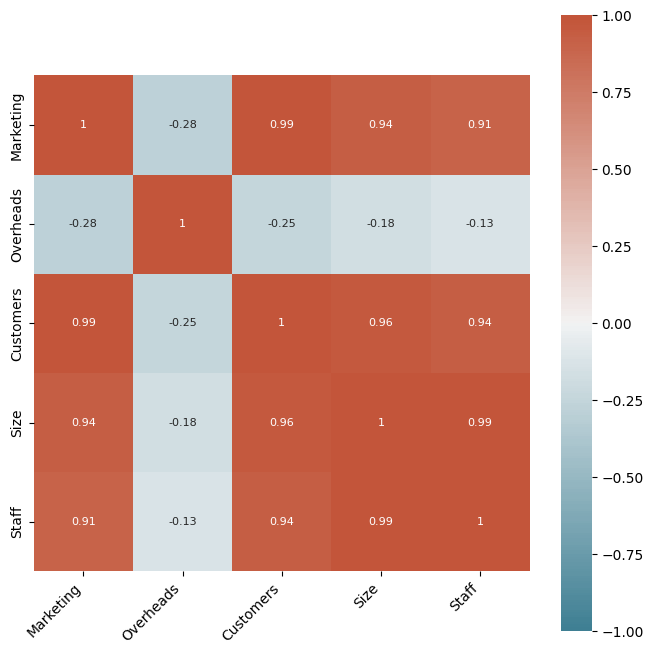

In [12]:
plt.figure(figsize=(8, 8))
corr = summary_data.corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True, annot=True,
                 annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()


Splitting the data into 4 categories.

In [13]:
summary_data_high = summary_data.loc[data.sum()> 600000]
summary_data_medium = summary_data.loc[(data.sum() > 100000) & (data.sum() <= 600000)]
summary_data_low = summary_data.loc[(data.sum() > 20000)  & (data.sum() <= 100000)]
summary_data_very_low = summary_data.loc[data.sum()<20000]
high_and_medium = [summary_data_high,summary_data_medium]
high_and_medium = pd.concat(high_and_medium)


Scatter plot with regression line.

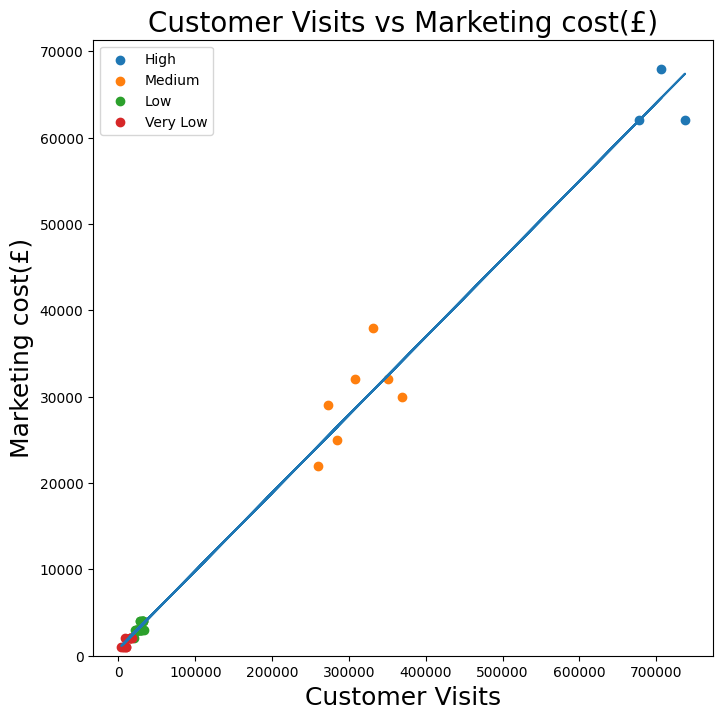

In [14]:
plt.figure(figsize=(8, 8))
plt.scatter(summary_data_high['Customers'], summary_data_high['Marketing'])
plt.scatter(summary_data_medium['Customers'], summary_data_medium['Marketing'])
plt.scatter(summary_data_low['Customers'], summary_data_low['Marketing'])
plt.scatter(summary_data_very_low['Customers'], summary_data_very_low['Marketing'])
z = np.polyfit(summary_data['Customers'], summary_data['Marketing'], 1)
trend = np.poly1d(z)
plt.plot(summary_data['Customers'], trend(summary_data['Customers']))
plt.ylim(ymin=0)
plt.title('Customer Visits vs Marketing cost(£)', fontsize=20)
plt.xlabel('Customer Visits', fontsize=18)
plt.ylabel('Marketing cost(£)', fontsize=18)
plt.legend(['High', 'Medium', 'Low','Very Low'], loc=2)
plt.show()


Time series distribution



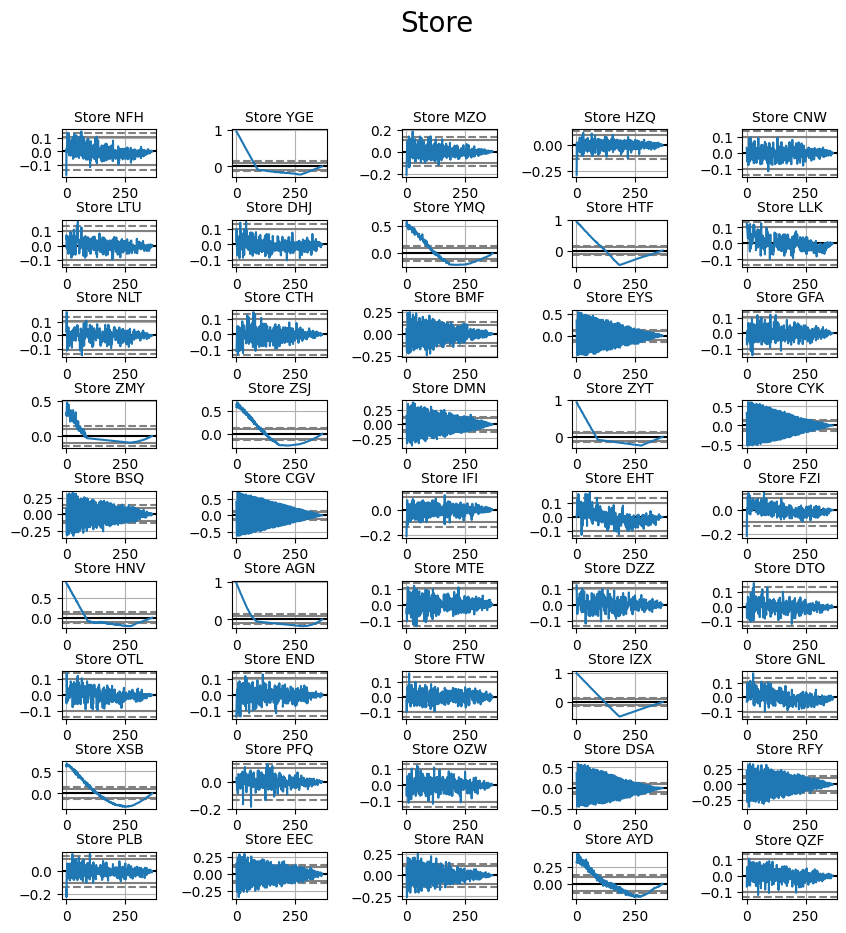

In [15]:
row = 0
col = 0
fig, axes = plt.subplots(figsize=(10, 10), nrows=9, ncols=5)
fig.suptitle('Store', fontsize=20, position=(0.5, 1.0))
for name in data.columns:
    sub = pd.plotting.autocorrelation_plot(dataCustomerVisits[name], axes[row, col])
    sub.set_title('Store ' + name, fontsize=10)
    sub.xaxis.label.set_visible(False)
    sub.yaxis.label.set_visible(False)
    col += 1
    if col == 5:
        row += 1
        col = 0
plt.subplots_adjust(wspace=0.8, hspace=0.9)
plt.show()



Looking for insights in marketing and customer visits


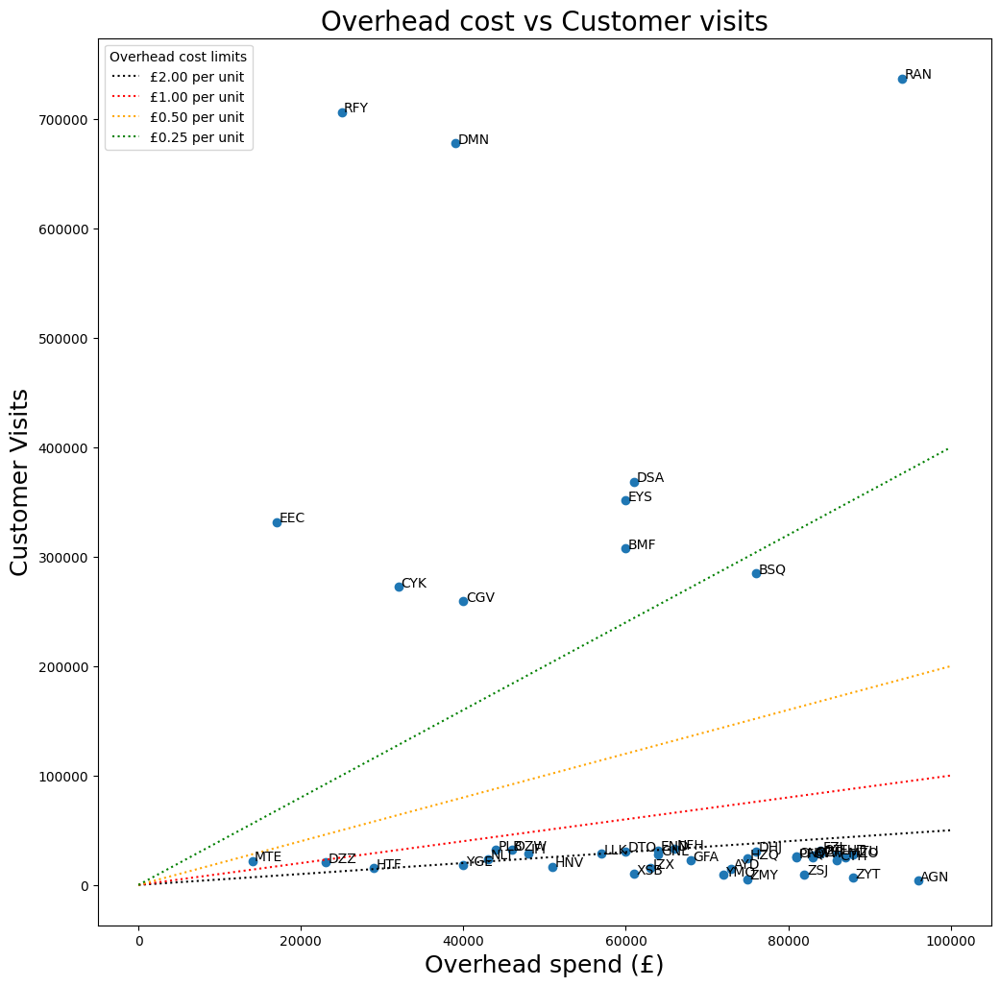

In [16]:
plt.figure(figsize=(12, 12))
plt.scatter(summary_data['Overheads'],summary_data['Customers'])
plt.title('Overhead cost vs Customer visits', fontsize=20)
plt.xlabel('Overhead spend (£)', fontsize=18)
plt.ylabel('Customer Visits', fontsize=18)
for i, name in enumerate(data.columns):
    plt.annotate(name, (summary_data['Overheads'][i] + 300,
                        summary_data['Customers'][i]))
plt.plot([0, 100000], [0,50000], linestyle=':', 
        color='black', label='£2.00 per unit')
plt.plot([0, 100000], [0, 100000], linestyle=':',
         color='red', label='£1.00 per unit')
plt.plot([0, 100000], [0, 200000], linestyle=':',
         color='orange', label='£0.50 per unit')
plt.plot([0, 100000], [0, 400000], linestyle=':',
         color='green', label='£0.25 per unit')
plt.legend(loc=2, title='Overhead cost limits')

plt.show()


converting the above plot to a bubble plot.

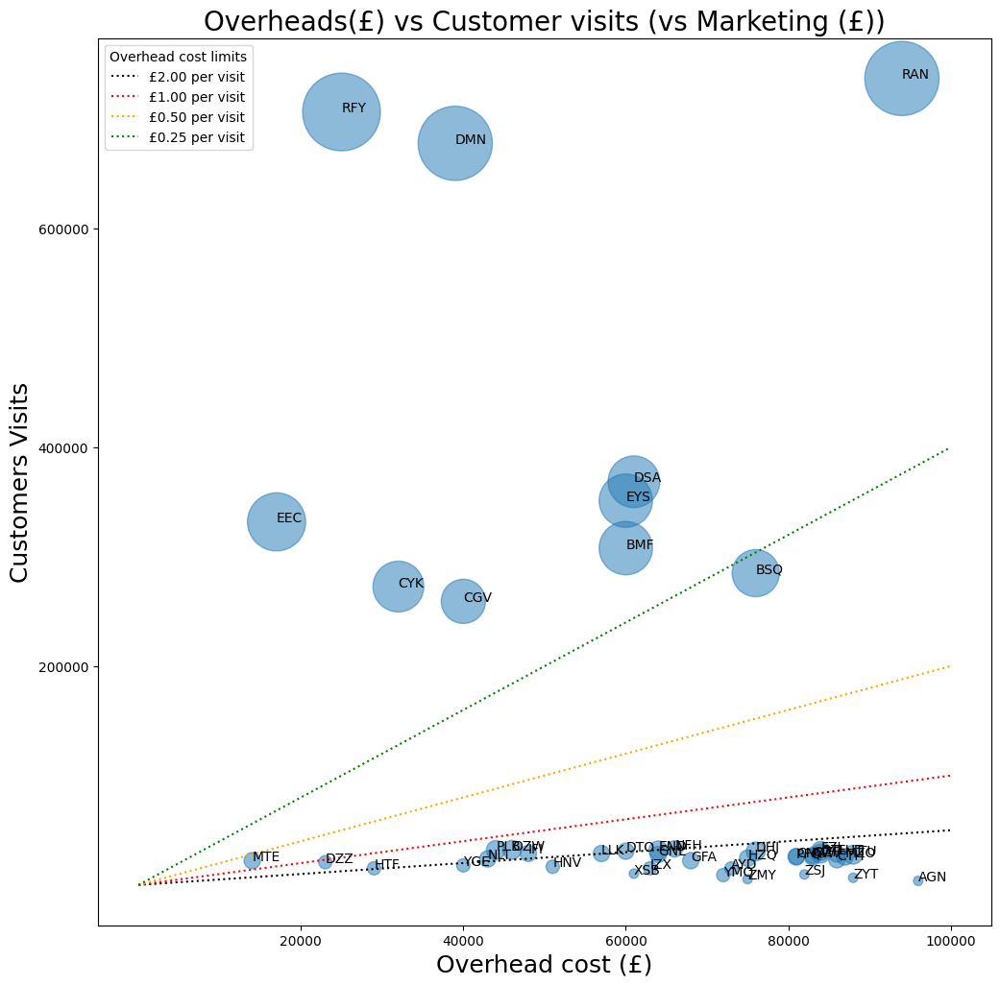

In [17]:
summary_data['BubbleSize'] = summary_data['Marketing'] * 0.05

plt.figure(figsize=(12, 12))
plt.scatter(summary_data['Overheads'], summary_data['Customers'],
         s=summary_data['BubbleSize'], alpha=0.5)
plt.xticks([20000, 40000, 60000, 80000, 100000])
plt.yticks([200000, 400000, 600000, 800000, 1000000])
plt.title('Overheads(£) vs Customer visits (vs Marketing (£))', fontsize=20)
plt.xlabel('Overhead cost (£)', fontsize=18)
plt.ylabel('Customers Visits', fontsize=18)
for i, name in enumerate(summary_data.index):
    plt.annotate(name, (summary_data['Overheads'][i], summary_data['Customers'][i]))
plt.plot([0, 100000], [0,50000], linestyle=':', 
        color='black', label='£2.00 per visit')
plt.plot([0, 100000], [0, 100000], linestyle=':',
         color='red', label='£1.00 per visit')
plt.plot([0, 100000], [0, 200000], linestyle=':',
         color='orange', label='£0.50 per visit')
plt.plot([0, 100000], [0, 400000], linestyle=':',
         color='green', label='£0.25 per visit')
plt.legend(loc=2, title='Overhead cost limits')
plt.show()


Normalising the data


In [25]:
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())


     Marketing  Overheads  Customers      Size     Staff  BubbleSize
NFH   0.044118   0.687500   0.044633  0.022948  0.036364    0.044118
YGE   0.029412   0.416667   0.024230  0.032215  0.036364    0.029412
MZO   0.044118   0.906250   0.034659  0.059576  0.072727    0.044118
HZQ   0.044118   0.781250   0.033159  0.050750  0.036364    0.044118
CNW   0.044118   0.843750   0.035304  0.057811  0.036364    0.044118


Radar plot for high volume outlets

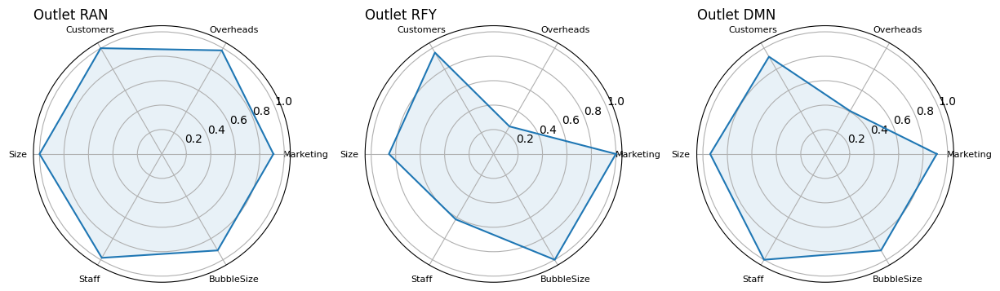

In [26]:
n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
plt.figure(figsize=(20, 20))
counter = 1
for name in High_Volume:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(5, 5, counter, polar=True)
    sub.plot(angles, values)
    sub.fill(angles, values, alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns, fontsize=8)
    sub.set_title('Outlet ' + name, fontsize=12, loc='left')
    counter += 1
plt.tight_layout()
plt.show()

Seasonality - Interactive barchar 

In [27]:
dataCustomerVisits = pd.read_csv('https://tinyurl.com/ChrisCoDV/001245231/OutletDailyCustomers.csv')
a=dataCustomerVisits.drop('Date',axis='columns')
b=a.T
c=b.sum().values
dataCustomerVisits['Customer Visits']=c
DateTotal=dataCustomerVisits[['Date','Customer Visits']]
fig = px.bar(DateTotal, x='Date', y='Customer Visits')
fig.update_layout(title='Daily total customer visits for all the outlets')
fig.show()